In [ ]:
from scipy import signal
import numpy as np
from scipy.fftpack import fft, ifft, ifftshift, fftshift
import matplotlib.pyplot as plt
from scipy.io.wavfile import read
from scipy.io import loadmat
from IPython.lib.display import Audio
from IPython.display import display, Image

%matplotlib widget



pi = np.pi

class Filter:
    def __init__(self, filterdata):
        coefficient = filterdata['ba'].astype(np.float64)
        self.b, self.a = coefficient[:,0], 1
    
    def filter(self, signal_):
        return signal.lfilter(self.b, self.a, signal_)
    
    def freqz(self):
        return signal.freqz(self.b, self.a)

## Reading Signals

In [ ]:
Fs1, x1 = read("civciv1.wav")
Fs2, x2 = read("civciv2.wav")
Fs3, x3 = read("civciv3.wav")

Fs4, x4 = read("tavuk1.wav")
Fs5, x5 = read("tavuk2.wav")
Fs6, x6 = read("tavuk3.wav")

x1 = x1[:int(x1.size/4)]
x2 = x2[:int(x2.size/4)]
x3 = x3[:int(x3.size/4)]

x4 = x4[:int(x4.size/4)]
x5 = x5[:int(x5.size/4)]
x6 = x6[:int(x6.size/4)]

## Sounds

In [ ]:
print("civciv 1") ; display(Audio(x1, rate=Fs1))
print("civciv 2") ; display(Audio(x2, rate=Fs2)) 
print("civciv 3") ; display(Audio(x3, rate=Fs3)) 
print("tavuk 1")  ; display(Audio(x4, rate=Fs4)) 
print("tavuk 2")  ; display(Audio(x5, rate=Fs5)) 
print("tavuk 3")  ; display(Audio(x6, rate=Fs6)) 

## Spectrums

In [ ]:
N = x1.size
w =np.linspace(pi , -pi, N)

x1_W = fftshift(fft(x1, N)) 
x2_W = fftshift(fft(x2, N)) 
x3_W = fftshift(fft(x3, N)) 

x4_W = fftshift(fft(x4, N))
x5_W = fftshift(fft(x5, N)) 
x6_W = fftshift(fft(x6, N))

plt.figure(figsize = (12,6))

plt.subplot(3,2,1); plt.plot(w/pi, abs(x1_W))
plt.title("civciv1")

plt.subplot(3,2,3); plt.plot(w/pi, abs(x2_W))
plt.title("civciv2")

plt.subplot(3,2,5); plt.plot(w/pi, abs(x3_W))
plt.title("civciv3")

plt.subplot(3,2,2); plt.plot(w/pi, abs(x4_W))
plt.title("tavuk1")

plt.subplot(3,2,4); plt.plot(w/pi, abs(x5_W))
plt.title("tavuk2")

plt.subplot(3,2,6); plt.plot(w/pi, abs(x6_W))
plt.title("tavuk3")

plt.tight_layout()

## Power Spectral Density

In [ ]:
## ONLY FOR X1

psdx = (1 / (2 * pi * N)) * np.abs(x1_W[:N//2+1]) ** 2
psdx[1:-1] = 2 * psdx[1:-1]
freq = np.linspace(0, pi, N//2+1)

plt.figure()
plt.plot(freq / pi, 10 * np.log10(psdx))
plt.grid(True)
plt.title("Power Spectral Density")
plt.xlabel("Normalized Frequency (×π rad/sample)")
plt.ylabel("Power/Frequency (dB/(rad/sample))")


## Mixing Signals and Spectrums

In [ ]:
mixed_1 = x1 + x4
mixed_2 = x2 + x5
mixed_3 = x3 + x6

N1 = x1.size
N2 = x2.size
N3 = x3.size

plt.figure(figsize = (12,6))

# Mixed 1
print("Mixed Signal 1")
display(Audio(mixed_1, rate=Fs1))

mixed_1_W = fftshift(fft(mixed_1, N)) 
plt.subplot(3,1,1); plt.plot(w/pi, np.abs(mixed_1_W))
plt.title("Mixed 1")


## Mixed 2
print("Mixed Signal 2")
display(Audio(mixed_2, rate=Fs2))

mixed_2_W = fftshift(fft(mixed_2, N2)) 
plt.subplot(3,1,2); plt.plot(w/pi, np.abs(mixed_2_W))
plt.title("Mixed 2")

## Mixed 3
print("Mixed Signal 3")
display(Audio(mixed_3, rate=Fs3))

mixed_3_W = fftshift(fft(mixed_3, N3)) 
plt.subplot(3,1,3); plt.plot(w/pi, np.abs(mixed_3_W))
plt.title("Mixed 3")

plt.tight_layout()

## Applying Ideal Filter to Mixed Signals

In [ ]:
filtered_chick_w = np.where(abs(w)>0.119*pi, mixed_1_W, 0)
filtered_chicken_w = np.where(abs(w)<0.103*pi, mixed_1_W, 0)

plt.figure(figsize = (12,6))
plt.subplot(2,1,1); plt.plot(w/pi, np.abs(filtered_chicken_w))
plt.title("Filtered Chicken 1")

plt.subplot(2,1,2); plt.plot(w/pi, np.abs(filtered_chick_w))
plt.title("Filtered Chicken 1")
plt.tight_layout()

filtered_chicken_t = ifft(ifftshift(filtered_chicken_w))
filtered_chick_t = ifft(ifftshift(filtered_chick_w))

print("Filtered Chicken (Ideal Bandpass Filter)")
display(Audio(filtered_chicken_t, rate=Fs1))
print("Filtered Chick (Ideal Bandpass Filter)")
display(Audio(filtered_chick_t, rate=Fs1))


## FIR Filter Design and Application

In [ ]:
chick_filter = Filter(loadmat("chick_filter.mat"))
chicken_filter_lowpass = Filter(loadmat("chicken_filter.mat"))
chicken_filter_bandstop = Filter(loadmat("chicken_filter_bandstop.mat"))


w_chick, chick_filter_w = chick_filter.freqz()
w_chicken1, chicken_filter_lowpass_w = chicken_filter_lowpass.freqz()
w_chicken2, chicken_filter_bandstop_w = chicken_filter_bandstop.freqz()


plt.figure(figsize=(12,6))
plt.subplot(3,2,1); plt.plot(w_chick/pi, np.abs(chick_filter_w))
plt.title("Magnitude Spectrum of Chick Filter"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude")

plt.subplot(3,2,2); plt.plot(w_chick/pi, np.unwrap(np.angle(chick_filter_w)))
plt.title("Phase Spectrum of Chick Filter"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Phase (radians)")

plt.subplot(3,2,3); plt.plot(w_chicken1/pi, np.abs(chicken_filter_lowpass_w))
plt.title("Magnitude Spectrum of Chicken Filter(HPF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude")

plt.subplot(3,2,4); plt.plot(w_chicken1/pi, np.unwrap(np.angle(chicken_filter_lowpass_w)))
plt.title("Phase Spectrum of Chicken Filter(HPF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Phase (radians)")

plt.subplot(3,2,5); plt.plot(w_chicken2/pi, np.abs(chicken_filter_bandstop_w))
plt.title("Magnitude Spectrum of Chicken Filter(BSF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude")

plt.subplot(3,2,6); plt.plot(w_chicken2/pi, np.unwrap(np.angle(chicken_filter_bandstop_w)))
plt.title("Phase Spectrum of Chicken Filter(BSF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Phase (radians)")

plt.tight_layout()

### Mixed 1

In [ ]:
filtered_chick = chick_filter.filter(mixed_1)
filtered_chick_w = fftshift(fft(filtered_chick))
filtered_chick_mag = np.abs(filtered_chick_w)

filtered_chicken1 = chicken_filter_lowpass.filter(mixed_1)
filtered_chicken1_w = fftshift(fft(filtered_chicken1))
filtered_chicken1_mag = np.abs(filtered_chicken1_w)

filtered_chicken2 = chicken_filter_bandstop.filter(mixed_1)
filtered_chicken2_w = fftshift(fft(filtered_chicken2))
filtered_chicken2_mag = np.abs(filtered_chicken2_w)

plt.figure(figsize=(12,7))
plt.subplot(3,1,1); plt.plot(w/pi, filtered_chick_mag)
plt.title("Filtered Chick Mag Spectrum"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,2); plt.plot(w/pi, filtered_chicken1_mag)
plt.title("Filtered Chicken Mag Spectrum (HPF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,3); plt.plot(w/pi, filtered_chicken2_mag)
plt.title("Filtered Chicken Mag Spectrum (BSF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.tight_layout()

print("Filtered Chick (Using Chick Filter)")
display(Audio(filtered_chick, rate=Fs1))
print("Filtered Chicken (Using HPF Filter)")
display(Audio(filtered_chicken1, rate=Fs1))
print("Filtered Chicken (Using BSF Filter)")
display(Audio(filtered_chicken2, rate=Fs1))

### Mixed 2

In [ ]:
filtered_chick = chick_filter.filter(mixed_2)
filtered_chick_w = fftshift(fft(filtered_chick))
filtered_chick_mag = np.abs(filtered_chick_w)

filtered_chicken1 = chicken_filter_lowpass.filter(mixed_2)
filtered_chicken1_w = fftshift(fft(filtered_chicken1))
filtered_chicken1_mag = np.abs(filtered_chicken1_w)

filtered_chicken2 = chicken_filter_bandstop.filter(mixed_2)
filtered_chicken2_w = fftshift(fft(filtered_chicken2))
filtered_chicken2_mag = np.abs(filtered_chicken2_w)

plt.figure(figsize=(12,7))
plt.subplot(3,1,1); plt.plot(w/pi, filtered_chick_mag)
plt.title("Filtered Chick Mag Spectrum"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,2); plt.plot(w/pi, filtered_chicken1_mag)
plt.title("Filtered Chicken Mag Spectrum (HPF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,3); plt.plot(w/pi, filtered_chicken2_mag)
plt.title("Filtered Chicken Mag Spectrum (BSF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.tight_layout()

print("Filtered Chick (Using Chick Filter)")
display(Audio(filtered_chick, rate=Fs1))
print("Filtered Chicken (Using HPF Filter)")
display(Audio(filtered_chicken1, rate=Fs1))
print("Filtered Chicken (Using BSF Filter)")
display(Audio(filtered_chicken2, rate=Fs1))

### Mixed 3

In [ ]:
filtered_chick = chick_filter.filter(mixed_3)
filtered_chick_w = fftshift(fft(filtered_chick))
filtered_chick_mag = np.abs(filtered_chick_w)

filtered_chicken1 = chicken_filter_lowpass.filter(mixed_3)
filtered_chicken1_w = fftshift(fft(filtered_chicken1))
filtered_chicken1_mag = np.abs(filtered_chicken1_w)

filtered_chicken2 = chicken_filter_bandstop.filter(mixed_3)
filtered_chicken2_w = fftshift(fft(filtered_chicken2))
filtered_chicken2_mag = np.abs(filtered_chicken2_w)

plt.figure(figsize=(12,7))
plt.subplot(3,1,1); plt.plot(w/pi, filtered_chick_mag)
plt.title("Filtered Chick Mag Spectrum"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,2); plt.plot(w/pi, filtered_chicken1_mag)
plt.title("Filtered Chicken Mag Spectrum (HPF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,3); plt.plot(w/pi, filtered_chicken2_mag)
plt.title("Filtered Chicken Mag Spectrum (BSF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.tight_layout()

print("Filtered Chick (Using Chick Filter)")
display(Audio(filtered_chick, rate=Fs1))
print("Filtered Chicken (Using HPF Filter)")
display(Audio(filtered_chicken1, rate=Fs1))
print("Filtered Chicken (Using BSF Filter)")
display(Audio(filtered_chicken2, rate=Fs1))

### IS IT CHICK OR CHICKEN?

In [ ]:
def get_source(signal_):
    voice_filtered_with_chick_filter = chick_filter.filter(signal_)
    voice_filtered_with_chick_filter_W = fftshift(fft(voice_filtered_with_chick_filter))
    voice_filtered_with_chick_filter_mag = np.abs(voice_filtered_with_chick_filter_W)


    voice_filtered_with_chicken_filter = chicken_filter_bandstop.filter(signal_)
    voice_filtered_with_chicken_filter_W = fftshift(fft(voice_filtered_with_chicken_filter))
    voice_filtered_with_chicken_filter_mag = np.abs(voice_filtered_with_chicken_filter_W)

    def calculate_energy(voice_filtered_with_chick_filter_mag):
        # Calculate energy as the sum of the squared magnitudes
        return np.sum(voice_filtered_with_chick_filter_mag ** 2) / len(voice_filtered_with_chick_filter_mag)

    energy_of_chick_filter = calculate_energy(voice_filtered_with_chick_filter_mag)
    energy_of_chicken_filter = calculate_energy(voice_filtered_with_chicken_filter_mag)

    #print("chick energy:",energy_of_chick_filter)
    #print("chicken energy:",energy_of_chicken_filter)

    if  energy_of_chick_filter > energy_of_chicken_filter:
        print("it's a chick")
        display(Image(filename='chick.jpg'))

    else:
        print("it's a chicken")
        display(Image(filename='chicken.jpg'))


get_source(x1)

## TESTING

### Sounds and Spectrums

Original Signal 1:


Mixed Signal 1:


Original Signal 2:


Mixed Signal 2:


Original Signal 3:


Mixed Signal 3:


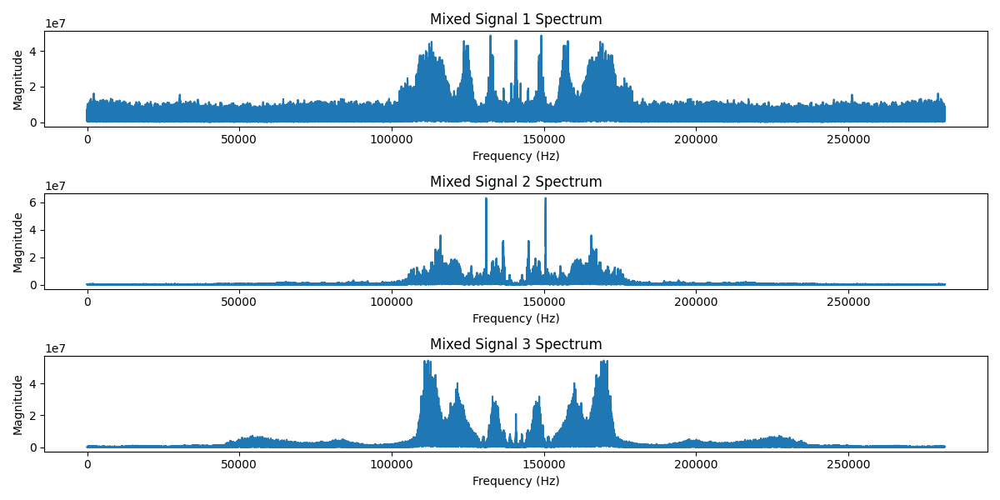

In [28]:
import numpy as np
from scipy.io import wavfile
from scipy.fft import fft, fftshift
import matplotlib.pyplot as plt
from IPython.display import Audio, display

# Function to read audio file
def read(file_name):
    Fs, sig = wavfile.read(file_name)
    return Fs, sig

# Read audio files
file_names = ["civciv_deneme1.wav", "civciv_deneme2.wav", "civciv_deneme3.wav",
              "tavuk_deneme1.wav", "tavuk_deneme2.wav", "tavuk_deneme3.wav"]

all_signals = []

# Read and store audio signals
for file_name in file_names:
    Fs, sig = read(file_name)
    all_signals.append(sig)

# Find the length of the shortest signal
min_length = min(len(sig) for sig in all_signals)

# Truncate or pad signals to the same length
for i in range(len(all_signals)):
    sig = all_signals[i]
    if len(sig) != min_length:
        # If the length is different, truncate or pad
        if len(sig) < min_length:
            # Pad with zeros
            all_signals[i] = np.pad(sig, (0, min_length - len(sig)), mode='constant')
        else:
            # Truncate
            all_signals[i] = sig[:min_length]

# Mix the signals
mixed_1_t = all_signals[0] + all_signals[3]
mixed_2_t = all_signals[1] + all_signals[4]
mixed_3_t = all_signals[2] + all_signals[5]

# Compute the spectra of mixed signals
mixed_1_W = fftshift(fft(mixed_1_t))
mixed_2_W = fftshift(fft(mixed_2_t))
mixed_3_W = fftshift(fft(mixed_3_t))

# Display original and mixed signals
for i, (sig, mixed_sig) in enumerate(zip(all_signals, [mixed_1_t, mixed_2_t, mixed_3_t])):
    print(f"Original Signal {i+1}:")
    display(Audio(sig, rate=Fs))
    print(f"Mixed Signal {i+1}:")
    display(Audio(mixed_sig, rate=Fs))

# Plot spectrums
plt.figure(figsize=(12, 6))

plt.subplot(311)
plt.plot(np.abs(mixed_1_W))
plt.title('Mixed Signal 1 Spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')

plt.subplot(312)
plt.plot(np.abs(mixed_2_W))
plt.title('Mixed Signal 2 Spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')

plt.subplot(313)
plt.plot(np.abs(mixed_3_W))
plt.title('Mixed Signal 3 Spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')

plt.tight_layout()
plt.show()


### Mixed 1 Testing

Filtered Chick (Using Chick Filter)


Filtered Chicken (Using HPF Filter)


Filtered Chicken (Using BSF Filter)


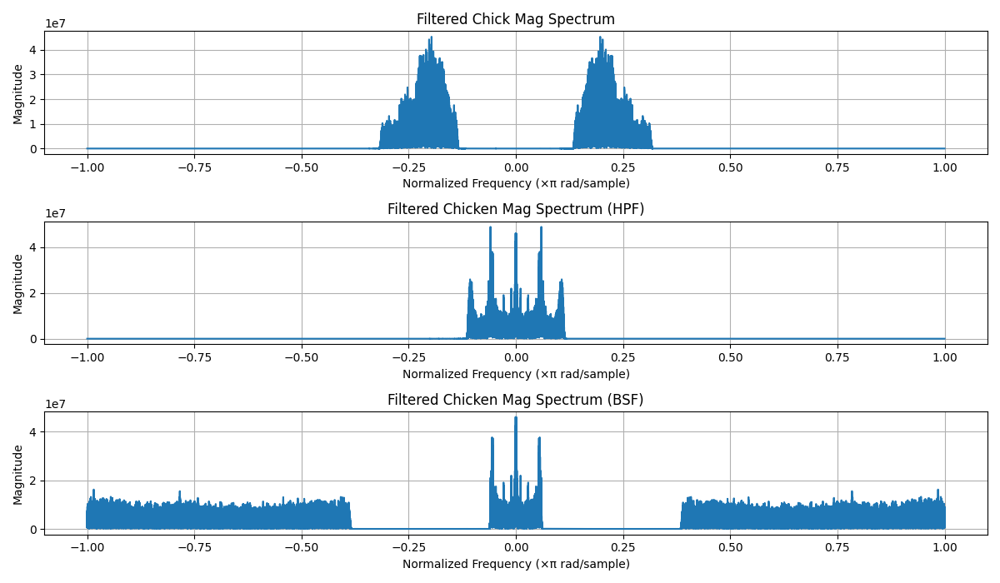

In [30]:
filtered_chick = chick_filter.filter(mixed_1_t)
filtered_chick_w = fftshift(fft(filtered_chick))
filtered_chick_mag = np.abs(filtered_chick_w)

filtered_chicken1 = chicken_filter_lowpass.filter(mixed_1_t)
filtered_chicken1_w = fftshift(fft(filtered_chicken1))
filtered_chicken1_mag = np.abs(filtered_chicken1_w)

filtered_chicken2 = chicken_filter_bandstop.filter(mixed_1_t)
filtered_chicken2_w = fftshift(fft(filtered_chicken2))
filtered_chicken2_mag = np.abs(filtered_chicken2_w)

N = all_signals[0].size
w =np.linspace(pi , -pi, N)

plt.figure(figsize=(12,7))
plt.subplot(3,1,1); plt.plot(w/pi, filtered_chick_mag)
plt.title("Filtered Chick Mag Spectrum"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,2); plt.plot(w/pi, filtered_chicken1_mag)
plt.title("Filtered Chicken Mag Spectrum (HPF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,3); plt.plot(w/pi, filtered_chicken2_mag)
plt.title("Filtered Chicken Mag Spectrum (BSF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.tight_layout()

print("Filtered Chick (Using Chick Filter)")
display(Audio(filtered_chick, rate=Fs))
print("Filtered Chicken (Using HPF Filter)")
display(Audio(filtered_chicken1, rate=Fs))
print("Filtered Chicken (Using BSF Filter)")
display(Audio(filtered_chicken2, rate=Fs))



### Mixed 2 Testing

Filtered Chick (Using Chick Filter)


Filtered Chicken (Using HPF Filter)


Filtered Chicken (Using BSF Filter)


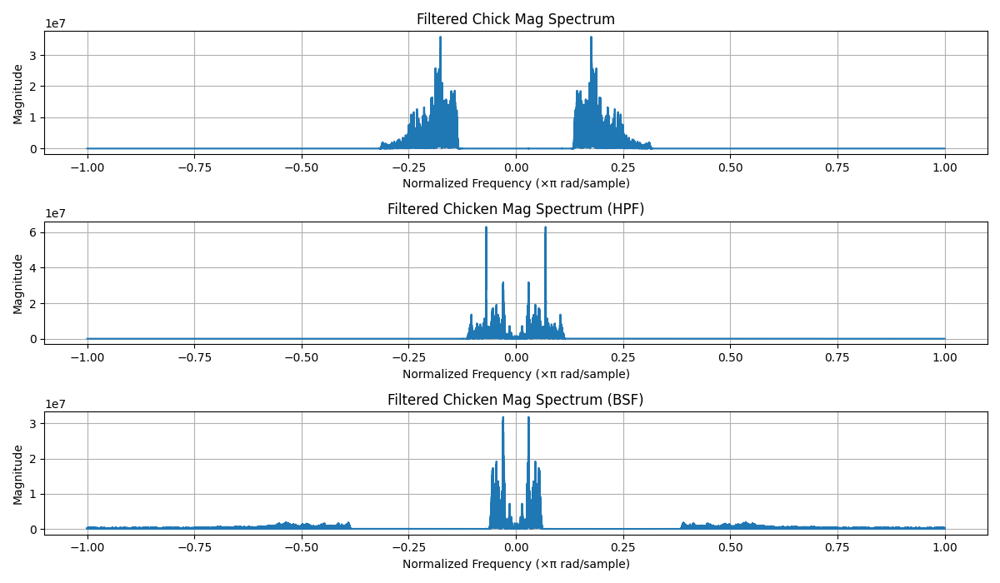

In [31]:
filtered_chick = chick_filter.filter(mixed_2_t)
filtered_chick_w = fftshift(fft(filtered_chick))
filtered_chick_mag = np.abs(filtered_chick_w)

filtered_chicken1 = chicken_filter_lowpass.filter(mixed_2_t)
filtered_chicken1_w = fftshift(fft(filtered_chicken1))
filtered_chicken1_mag = np.abs(filtered_chicken1_w)

filtered_chicken2 = chicken_filter_bandstop.filter(mixed_2_t)
filtered_chicken2_w = fftshift(fft(filtered_chicken2))
filtered_chicken2_mag = np.abs(filtered_chicken2_w)


plt.figure(figsize=(12,7))
plt.subplot(3,1,1); plt.plot(w/pi, filtered_chick_mag)
plt.title("Filtered Chick Mag Spectrum"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,2); plt.plot(w/pi, filtered_chicken1_mag)
plt.title("Filtered Chicken Mag Spectrum (HPF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,3); plt.plot(w/pi, filtered_chicken2_mag)
plt.title("Filtered Chicken Mag Spectrum (BSF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.tight_layout()

print("Filtered Chick (Using Chick Filter)")
display(Audio(filtered_chick, rate=Fs))
print("Filtered Chicken (Using HPF Filter)")
display(Audio(filtered_chicken1, rate=Fs))
print("Filtered Chicken (Using BSF Filter)")
display(Audio(filtered_chicken2, rate=Fs))



### Mixed 3 Testing

Filtered Chick (Using Chick Filter)


Filtered Chicken (Using HPF Filter)


Filtered Chicken (Using BSF Filter)


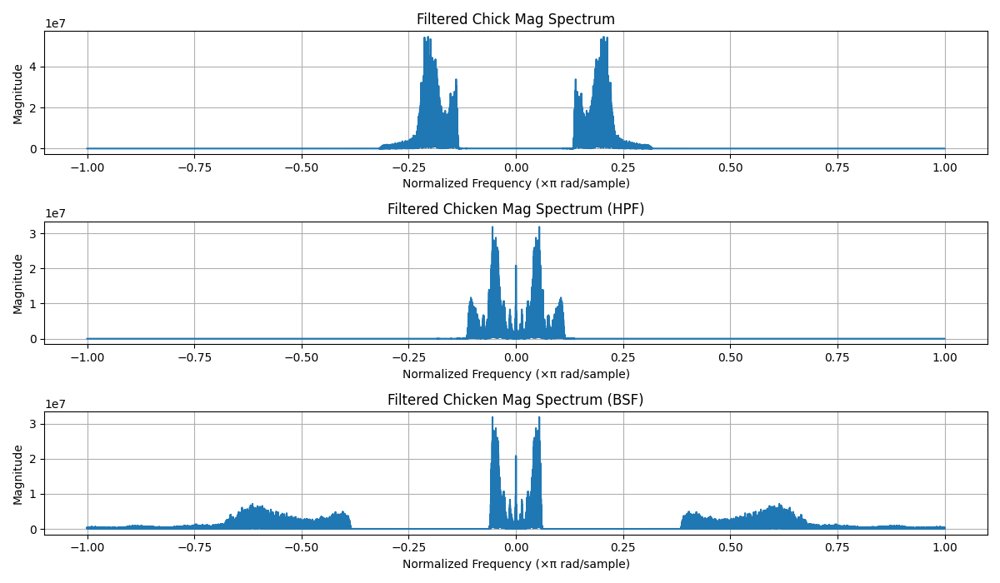

In [32]:
filtered_chick = chick_filter.filter(mixed_3_t)
filtered_chick_w = fftshift(fft(filtered_chick))
filtered_chick_mag = np.abs(filtered_chick_w)

filtered_chicken1 = chicken_filter_lowpass.filter(mixed_3_t)
filtered_chicken1_w = fftshift(fft(filtered_chicken1))
filtered_chicken1_mag = np.abs(filtered_chicken1_w)

filtered_chicken2 = chicken_filter_bandstop.filter(mixed_3_t)
filtered_chicken2_w = fftshift(fft(filtered_chicken2))
filtered_chicken2_mag = np.abs(filtered_chicken2_w)


plt.figure(figsize=(12,7))
plt.subplot(3,1,1); plt.plot(w/pi, filtered_chick_mag)
plt.title("Filtered Chick Mag Spectrum"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,2); plt.plot(w/pi, filtered_chicken1_mag)
plt.title("Filtered Chicken Mag Spectrum (HPF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.subplot(3,1,3); plt.plot(w/pi, filtered_chicken2_mag)
plt.title("Filtered Chicken Mag Spectrum (BSF)"); plt.xlabel("Normalized Frequency (×π rad/sample)"); plt.ylabel("Magnitude"); plt.grid(True)

plt.tight_layout()

print("Filtered Chick (Using Chick Filter)")
display(Audio(filtered_chick, rate=Fs))
print("Filtered Chicken (Using HPF Filter)")
display(Audio(filtered_chicken1, rate=Fs))
print("Filtered Chicken (Using BSF Filter)")
display(Audio(filtered_chicken2, rate=Fs))
